References:
- https://www.kaggle.com/code/ashishpatel26/gan-beginner-tutorial-for-pytorch-celeba-dataset


### Import packages

In [1]:
import os
import torch
from torchvision import transforms
from torchvision.datasets import CelebA
from torch.utils.data import DataLoader, Subset
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

### Hyperparameters

In [2]:
image_size = 80
batch_size_train = 1000
batch_size_val = 1000
num_workers = 0
shuffle_loader = False
root = 'datasets/'
TARGET_ATTR = 'Eyeglasses' # 'Wearing_Hat', 'Bald', 'Bangs', 'Goatee', 'Male', 'No_Beard', 'Smiling', 'Mouth_Slightly_Open', 'Eyeglasses'
style = 'gray'

In [3]:
ATTR = "5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes Bald Bangs Big_Lips Big_Nose Black_Hair Blond_Hair Blurry Brown_Hair Bushy_Eyebrows Chubby Double_Chin Eyeglasses Goatee Gray_Hair Heavy_Makeup High_Cheekbones Male Mouth_Slightly_Open Mustache Narrow_Eyes No_Beard Oval_Face Pale_Skin Pointy_Nose Receding_Hairline Rosy_Cheeks Sideburns Smiling Straight_Hair Wavy_Hair Wearing_Earrings Wearing_Hat Wearing_Lipstick Wearing_Necklace Wearing_Necktie Young"
ATTR = {attr: attr_idx for attr_idx, attr in enumerate(ATTR.split(' '))}
target_attr_index = ATTR[TARGET_ATTR]
target_attr_index

15

### Load Dataset & Create dataloader

In [4]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.Grayscale(1),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

In [5]:
# order = list(range(1600))
# dataset_train = Subset(CelebA(root=root, split='train', transform=transform, target_type='attr', download=False), order)  # If you want to use a smaller subset of dataset
dataset_train = CelebA(root=root, split='train', transform=transform, target_type='attr', download=False)
dataset_val = CelebA(root=root, split='valid', transform=transform, target_type='attr', download=False)

In [6]:
loader_train = DataLoader(dataset=dataset_train, batch_size=batch_size_train, shuffle=shuffle_loader, num_workers=num_workers, drop_last=False)
loader_val = DataLoader(dataset=dataset_val, batch_size=batch_size_val, shuffle=False, num_workers=num_workers, drop_last=False)

In [7]:
attr_true_list_train = []
attr_false_list_train = []
cnt = [10, 10]
for i, (im, lab) in enumerate(loader_train):
    for j, l in enumerate(lab[...,target_attr_index]):
        if l==1 and cnt[1] > 0:
            attr_true_list_train.append(j)
            cnt[1] -= 1
        elif l==0 and cnt[0] > 0:
            attr_false_list_train.append(j)
            cnt[0] -= 1
    if sum(cnt) == 0 : break
print(attr_true_list_train)
print(attr_false_list_train)

[52, 92, 118, 143, 151, 153, 187, 188, 192, 201]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [8]:
attr_true_list_val = []
attr_false_list_val = []
cnt = [10, 10]
for i, (im, lab) in enumerate(loader_val):
    for j, l in enumerate(lab[...,target_attr_index]):
        if l==1 and cnt[1] > 0:
            attr_true_list_val.append(j)
            cnt[1] -= 1
        elif l==0 and cnt[0] > 0:
            attr_false_list_val.append(j)
            cnt[0] -= 1
    if sum(cnt) == 0 : break
print(attr_true_list_val)
print(attr_false_list_val)

[15, 25, 36, 45, 62, 74, 96, 105, 114, 118]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [9]:
len(dataset_train), len(dataset_val)

(162770, 19867)

### Example of visualization

Attribute: False


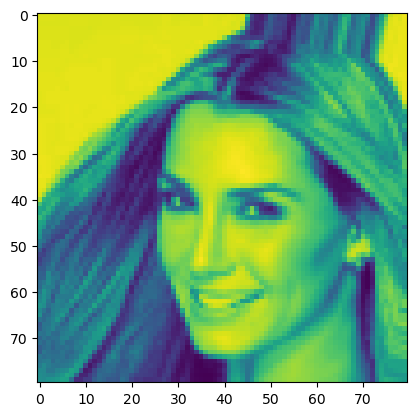

In [10]:
denorm = transforms.Normalize((-1,),(2,))

def im_show(img, ax=None):
    img_denorm = denorm(img)
    img_t = torch.permute(img_denorm, (1,2,0))
    img_t.clamp_(0, 1)
    if ax is not None:
        ax.imshow(img_t)
    else:
        plt.imshow(img_t)

img_example, label_example = next(iter(loader_train))

im_show(img_example[0])
print("Attribute:", label_example[0][target_attr_index].item()==1)

In [11]:
def comparison_figure(pca, dataset, indices, save_name):
    fig, axes = plt.subplots(2, len(indices), figsize=(2.6*len(indices), 5))
    
    for i, img_ind in tqdm(enumerate(indices)):
        img, _ = dataset[img_ind]
        projected = pca.transform(img).cpu()
        im_show(img, axes[0][i])
        im_show(projected[0], axes[1][i])
        axes[0][i].axis('off')
        axes[1][i].axis('off')

    axes[0][0].set_ylabel('Original')
    axes[1][0].set_ylabel('Results')
    fig.tight_layout(pad=0)
    if not os.path.exists(f'figures/{TARGET_ATTR}_{target_attr_index}'):
        os.makedirs(f'figures/{TARGET_ATTR}_{target_attr_index}')
    fig.savefig(os.path.join(f'figures/{TARGET_ATTR}_{target_attr_index}',save_name))

### Run PCA - Vanilla Streaming PCA, $k=1000$

In [12]:
from fair_streaming_pca import FairStreamingPCA

pca_vanilla = FairStreamingPCA(TARGET_ATTR, device='mps')

In [13]:
skip = False
if not skip:
    torch.manual_seed(0)
    pca_vanilla.fit(
        dataset=dataset_train,
        target_unfair_dim=None,
        target_pca_dim=1000,
        n_iter_unfair=None,
        n_iter_pca=5,
        block_size_unfair=None,
        block_size_pca=32554,
        batch_size=batch_size_train,
        constraint='vanilla',
        unfairness_frequent_direction=True,
        verbose=True,
        seed=0,
        save_V=True
    )

    if not os.path.isdir(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/'):
        os.makedirs(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/')
    torch.save(pca_vanilla.V, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_vanilla.pt')

tensor(True)


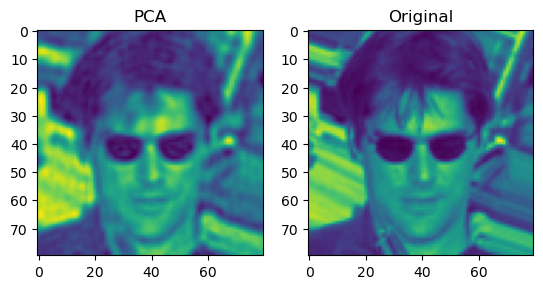

In [14]:
index = attr_true_list_train[0]
img_example, label_example = dataset_train[index]
print(label_example[pca_vanilla.a]==1)

pca_vanilla = FairStreamingPCA(TARGET_ATTR, device='mps')
pca_vanilla.V = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_vanilla.pt')
projected = pca_vanilla.transform(img_example).cpu()
fig, ax = plt.subplots(1,2)
im_show(projected[0], ax[0])
im_show(img_example, ax[1])
ax[0].title.set_text('PCA')
ax[1].title.set_text('Original')

### Run PCA - Fair Streaming PCA (mean) , $k=1000$

In [15]:
from fair_streaming_pca import FairStreamingPCA

m = None  # target_unfair_dim

torch.manual_seed(0)
pca_all = FairStreamingPCA(TARGET_ATTR, device='mps')
pca_all.fit(
    dataset=dataset_train,
    target_unfair_dim=m,
    target_pca_dim=1000,
    n_iter_unfair=5,
    n_iter_pca=5,
    block_size_unfair=32554,
    block_size_pca=32554,
    batch_size=batch_size_train,
    constraint='mean',
    unfairness_frequent_direction=False,
    verbose=True,
    seed=0,
    save_V=True
)

torch.save(pca_all.V, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_mean.pt')
torch.save(pca_all.N, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_mean.pt')

UnfairEstim::   0%|          | 0/5 [00:00<?, ?it/s]

UnfairEstim(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA::   0%|          | 0/5 [00:00<?, ?it/s]

PCA(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

In [16]:
V = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_mean.pt').to(pca_all.device)
N = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_mean.pt').to(pca_all.device)

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


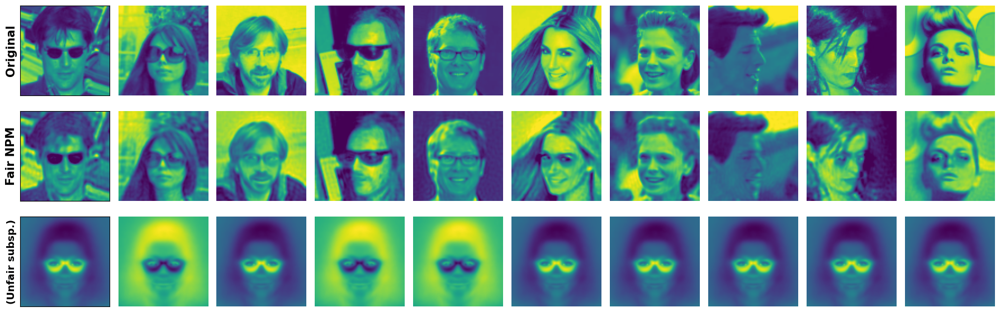

In [17]:
indices = attr_true_list_train[:5] + attr_false_list_train[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_train[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_train.pdf')

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


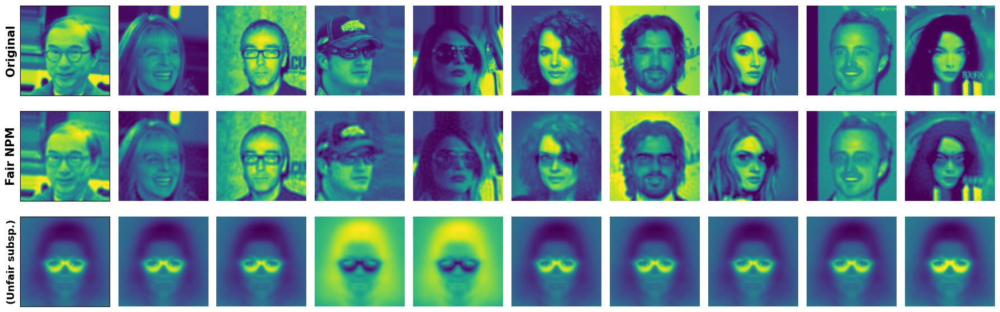

In [18]:
indices = attr_true_list_val[:5] + attr_false_list_val[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_val[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_val.pdf')

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

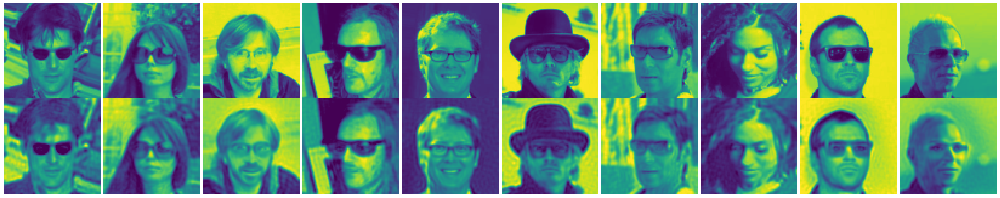

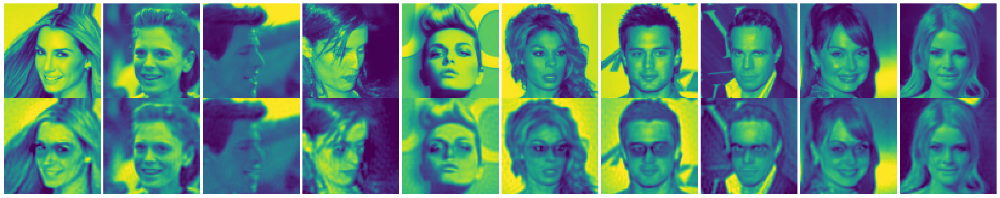

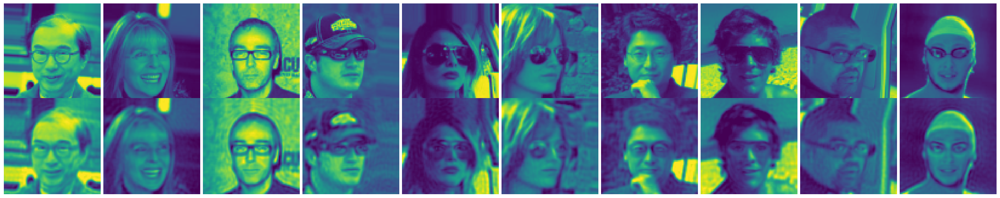

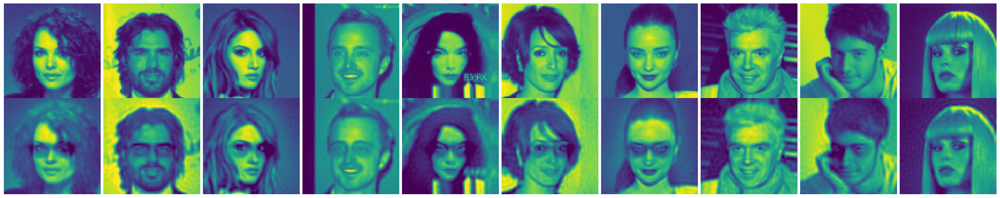

In [19]:
algo = f'fairMean'
pca_all.V = V
comparison_figure(pca_all, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_all, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_all, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_all, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')

### Run PCA - Fair Streaming PCA (mean+covariance=all) , $k=1000, m=2$

In [20]:
from fair_streaming_pca import FairStreamingPCA

m = 2  # target_unfair_dim


torch.manual_seed(0)
pca_all = FairStreamingPCA(TARGET_ATTR, device='mps')
pca_all.fit(
    dataset=dataset_train,
    target_unfair_dim=m,
    target_pca_dim=1000,
    n_iter_unfair=5,
    n_iter_pca=5,
    block_size_unfair=32554,
    block_size_pca=32554,
    batch_size=batch_size_train,
    constraint='all',
    unfairness_frequent_direction=False,
    verbose=True,
    seed=0,
    save_V=True
)

torch.save(pca_all.V, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_all{m}.pt')
torch.save(pca_all.N, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_all{m}.pt')

UnfairEstim::   0%|          | 0/5 [00:00<?, ?it/s]

UnfairEstim(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA::   0%|          | 0/5 [00:00<?, ?it/s]

PCA(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

In [21]:
V = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_all{m}.pt').to(pca_all.device)
N = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_all{m}.pt').to(pca_all.device)

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


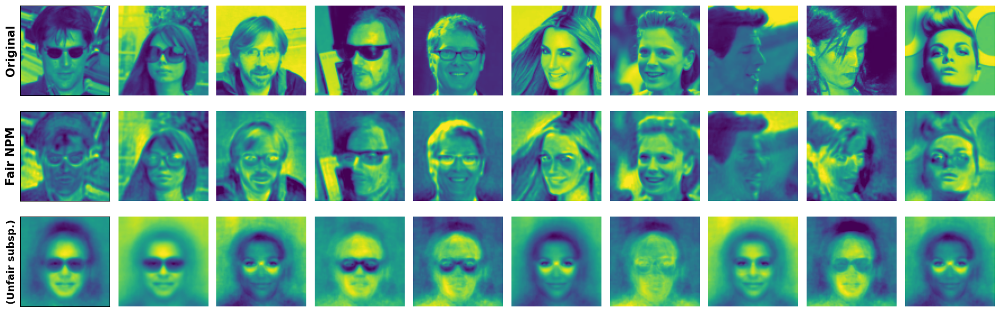

In [22]:
indices = attr_true_list_train[:5] + attr_false_list_train[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_train[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_train.pdf')

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


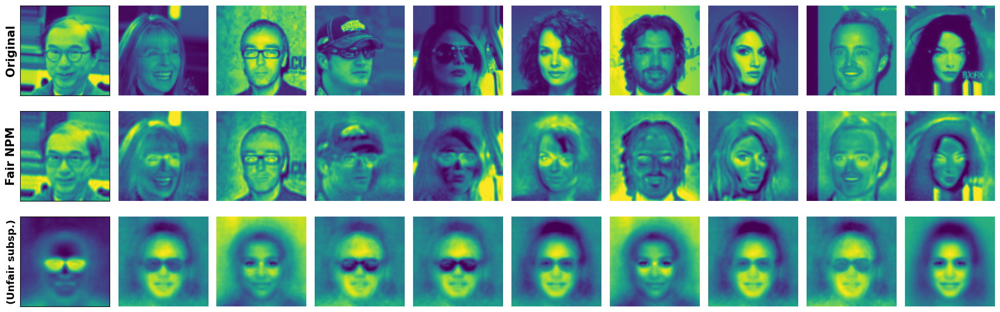

In [23]:
indices = attr_true_list_val[:5] + attr_false_list_val[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_val[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_val.pdf')

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

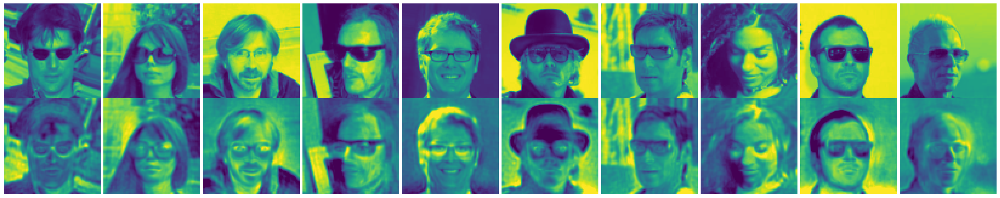

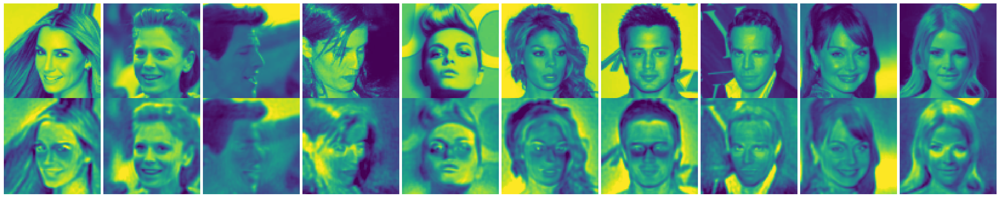

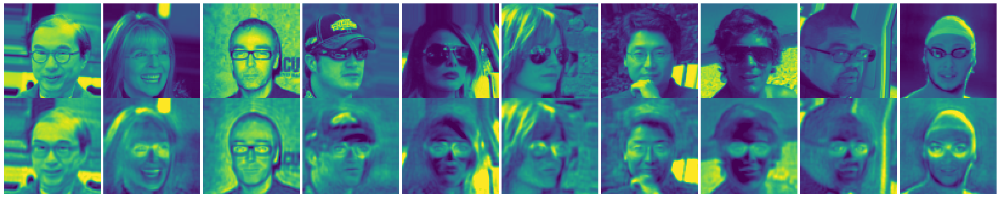

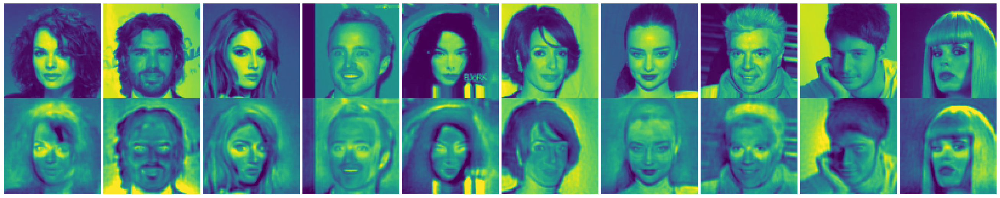

In [24]:
algo = f'fairAll{m}'
pca_all.V = V
comparison_figure(pca_all, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_all, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_all, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_all, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')

### Run PCA - Fair Streaming PCA (mean+covariance=all) , $k=1000, m=5$

In [25]:
from fair_streaming_pca import FairStreamingPCA

m = 5  # target_unfair_dim

torch.manual_seed(0)
pca_all = FairStreamingPCA(TARGET_ATTR, device='mps')
pca_all.fit(
    dataset=dataset_train,
    target_unfair_dim=m,
    target_pca_dim=1000,
    n_iter_unfair=5,
    n_iter_pca=5,
    block_size_unfair=32554,
    block_size_pca=32554,
    batch_size=batch_size_train,
    constraint='all',
    unfairness_frequent_direction=False,
    verbose=True,
    seed=0,
    save_V=True
)

torch.save(pca_all.V, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_all{m}.pt')
torch.save(pca_all.N, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_all{m}.pt')

UnfairEstim::   0%|          | 0/5 [00:00<?, ?it/s]

UnfairEstim(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA::   0%|          | 0/5 [00:00<?, ?it/s]

PCA(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

In [26]:
V = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_all{m}.pt').to(pca_all.device)
N = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_all{m}.pt').to(pca_all.device)

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


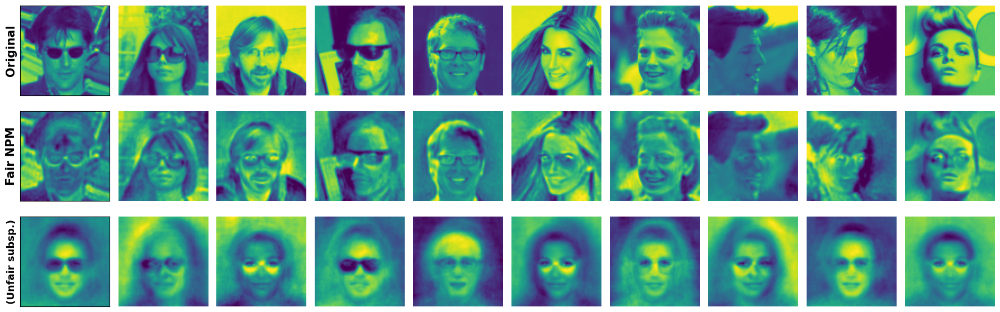

In [27]:
indices = attr_true_list_train[:5] + attr_false_list_train[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_train[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_train.pdf')

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


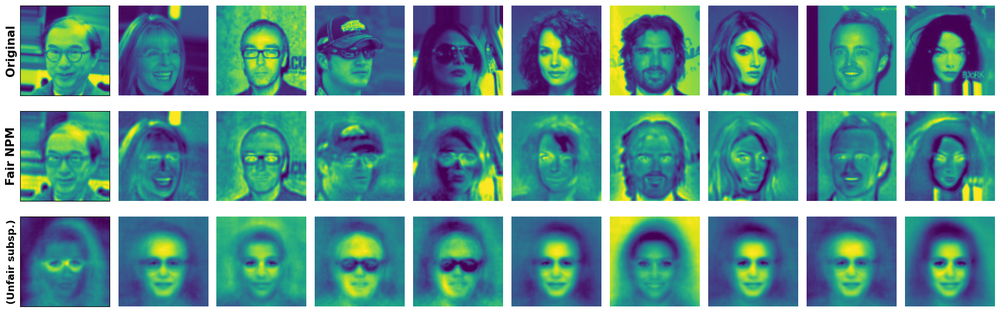

In [28]:
indices = attr_true_list_val[:5] + attr_false_list_val[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_val[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_val.pdf')

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

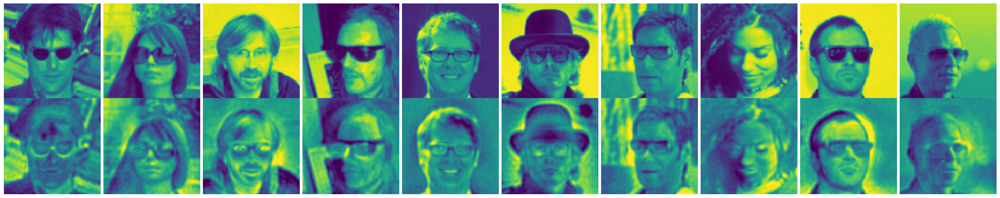

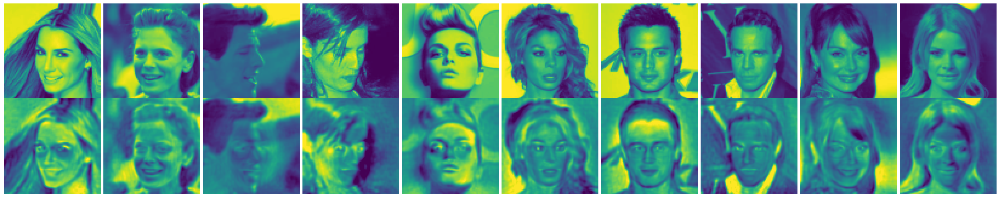

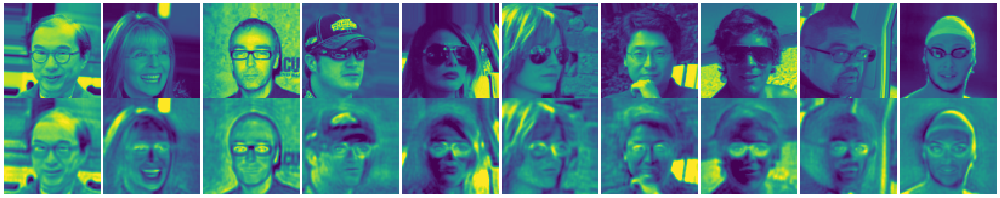

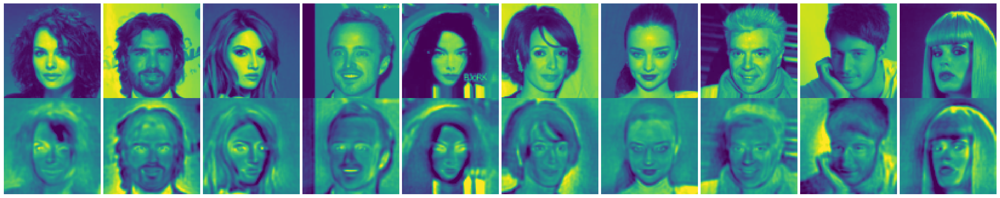

In [29]:
algo = f'fairAll{m}'
pca_all.V = V
comparison_figure(pca_all, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_all, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_all, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_all, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')

### Run PCA - Fair Streaming PCA (mean+covariance=all) , $k=1000, m=10$

In [30]:
from fair_streaming_pca import FairStreamingPCA

m = 10  # target_unfair_dim

torch.manual_seed(0)
pca_all = FairStreamingPCA(TARGET_ATTR, device='mps')
pca_all.fit(
    dataset=dataset_train,
    target_unfair_dim=m,
    target_pca_dim=1000,
    n_iter_unfair=5,
    n_iter_pca=5,
    block_size_unfair=32554,
    block_size_pca=32554,
    batch_size=batch_size_train,
    constraint='all',
    unfairness_frequent_direction=False,
    verbose=True,
    seed=0,
    save_V=True
)

torch.save(pca_all.V, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_all{m}.pt')
torch.save(pca_all.N, f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_all{m}.pt')

UnfairEstim::   0%|          | 0/5 [00:00<?, ?it/s]

UnfairEstim(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

UnfairEstim(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA::   0%|          | 0/5 [00:00<?, ?it/s]

PCA(1/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(2/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(3/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(4/5)::   0%|          | 0/33 [00:00<?, ?it/s]

PCA(5/5)::   0%|          | 0/33 [00:00<?, ?it/s]

In [31]:
V = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/V_all{m}.pt').to(pca_all.device)
N = torch.load(f'Tensors/{TARGET_ATTR}_{target_attr_index}/{style}/N_all{m}.pt').to(pca_all.device)

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


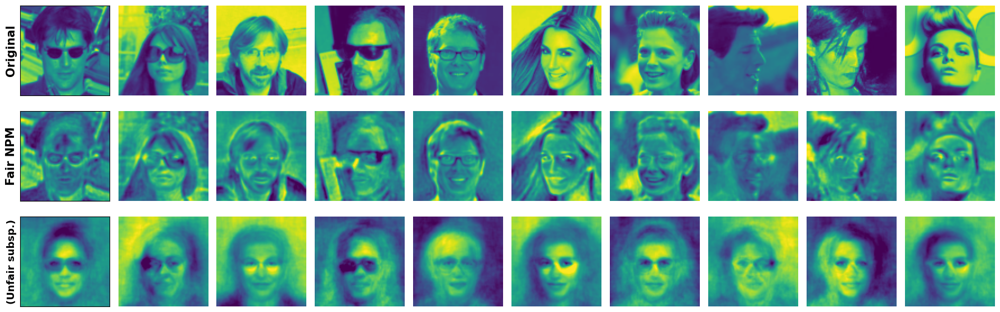

In [32]:
indices = attr_true_list_train[:5] + attr_false_list_train[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_train[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_train.pdf')

tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(True)
tensor(False)
tensor(False)
tensor(False)
tensor(False)
tensor(False)


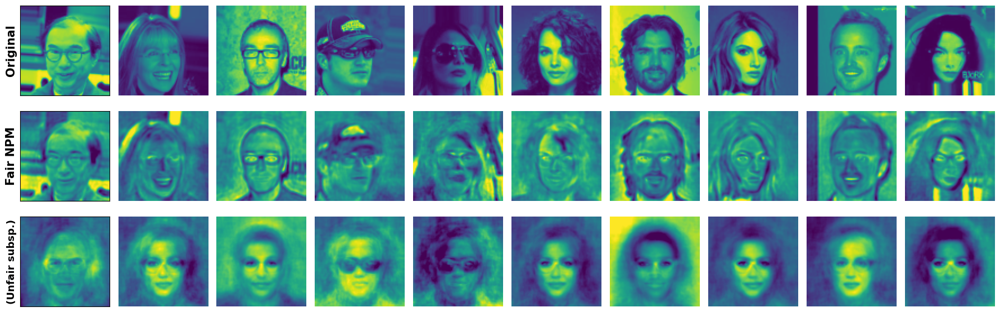

In [33]:
indices = attr_true_list_val[:5] + attr_false_list_val[:5]
fig, ax = plt.subplots(3, len(indices), figsize=(18, 6))
ax[0][0].set_ylabel('Original', weight='bold', fontsize=15); 
ax[1][0].set_ylabel('Fair NPM', weight='bold', fontsize=15); 
ax[2][0].set_ylabel('(Unfair subsp.)', weight='bold', fontsize=13); 
for i, index in enumerate(indices):
    img_example, label_example = dataset_val[index]
    print(label_example[pca_all.a]==1)
    pca_all.V = V
    projected_all = pca_all.transform(img_example).cpu()
    pca_all.V = N
    projected_orth = pca_all.transform(img_example).cpu()
    im_show(img_example, ax[0][i])
    im_show(projected_all[0], ax[1][i])
    im_show(projected_orth[0], ax[2][i])
    ax[0][i].get_xaxis().set_ticks([])
    ax[0][i].get_yaxis().set_ticks([])
    ax[1][i].get_xaxis().set_ticks([])
    ax[1][i].get_yaxis().set_ticks([])
    ax[2][i].get_xaxis().set_ticks([])
    ax[2][i].get_yaxis().set_ticks([])
    if i == 0:
        ax[0][i].xaxis.set_visible(False)
        ax[1][i].xaxis.set_visible(False)
        ax[2][i].xaxis.set_visible(False)
        ax[0][i].set_yticklabels([])
        ax[1][i].set_yticklabels([])
        ax[2][i].set_yticklabels([])
    else:
        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')
fig.tight_layout()
# fig.savefig(f'comparison_celeba_{style}_{TARGET_ATTR}_val.pdf')

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

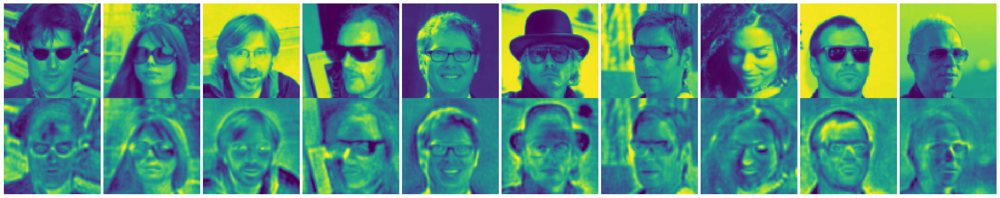

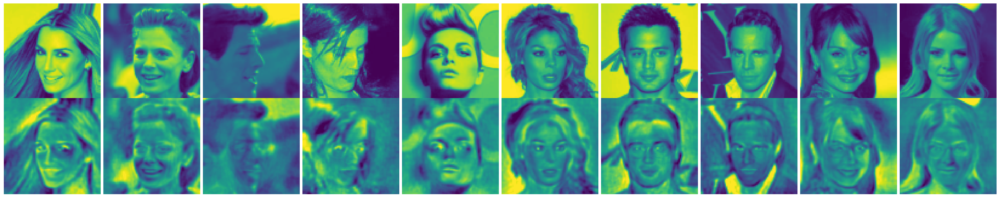

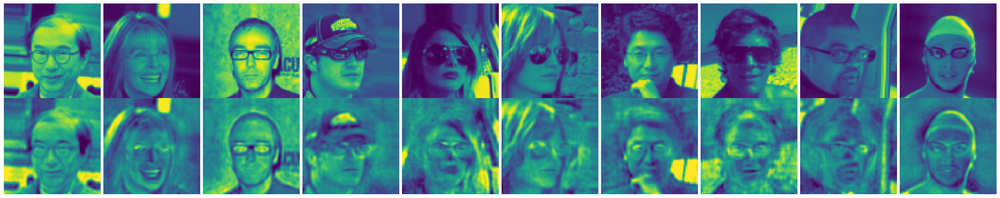

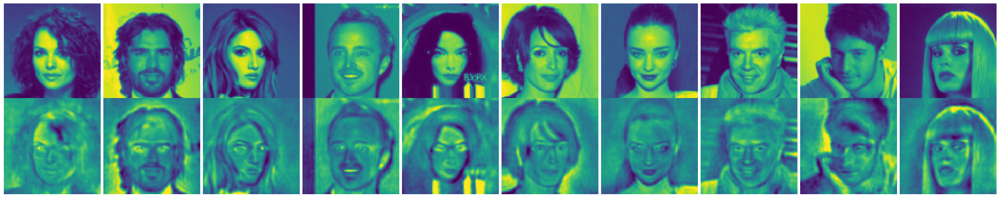

In [34]:
algo = f'fairAll{m}'
pca_all.V = V
comparison_figure(pca_all, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_all, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_all, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_all, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')

### Run PCA - Kleindessner

Data Collection::   0%|          | 0/163 [00:00<?, ?it/s]

mean matching...
PCA...
Covariance Size: torch.Size([1, 6399, 6399])


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

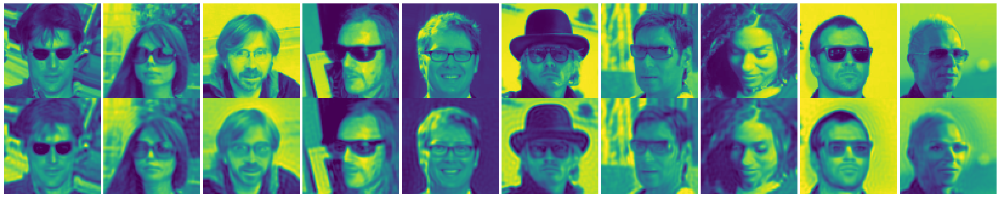

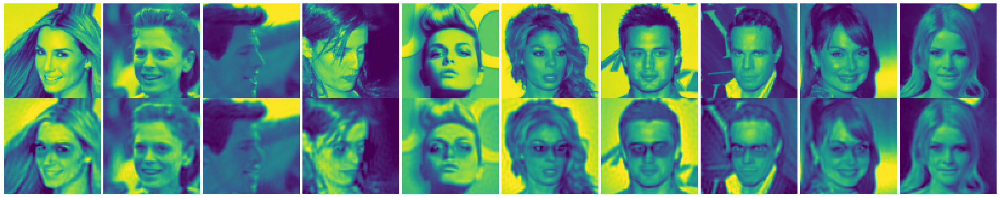

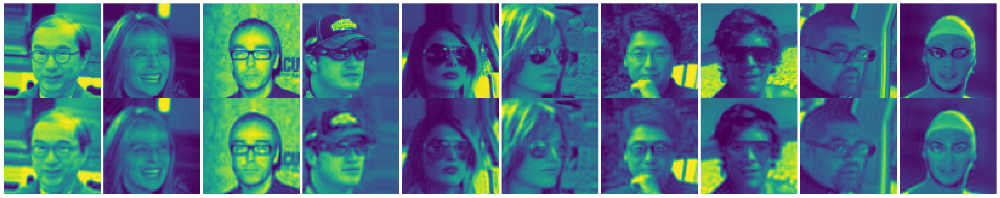

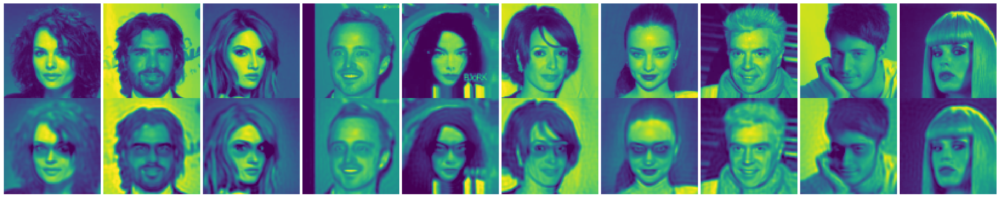

In [35]:
from fair_streaming_pca import FairStreamingPCA

pca_offline = FairStreamingPCA(TARGET_ATTR, device='cpu')
pca_offline.fit_offline(
    loader=loader_train,
    target_unfair_dim=None,
    target_pca_dim=1000,
    constraint='mean',
)

algo = 'fairMeanOffline'
comparison_figure(pca_offline, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_offline, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_offline, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_offline, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')

Data Collection::   0%|          | 0/163 [00:00<?, ?it/s]

mean matching...
covariance matching...
PCA...
Covariance Size: torch.Size([1, 6397, 6397])


0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

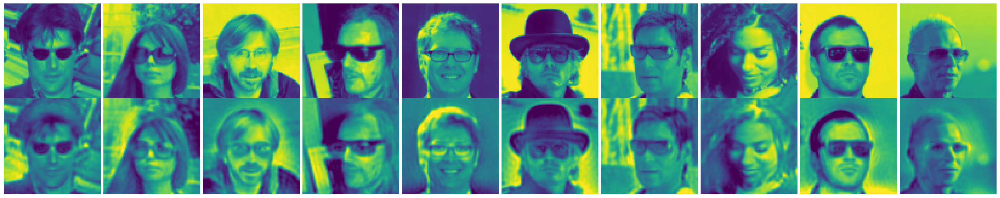

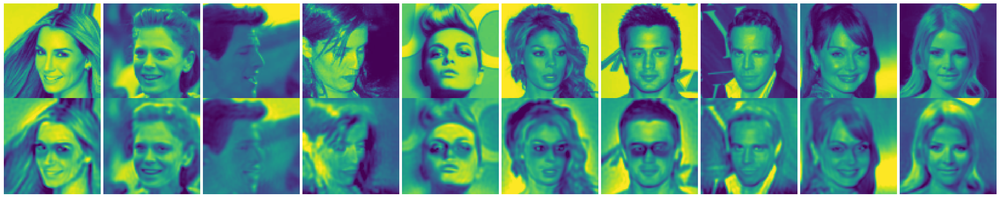

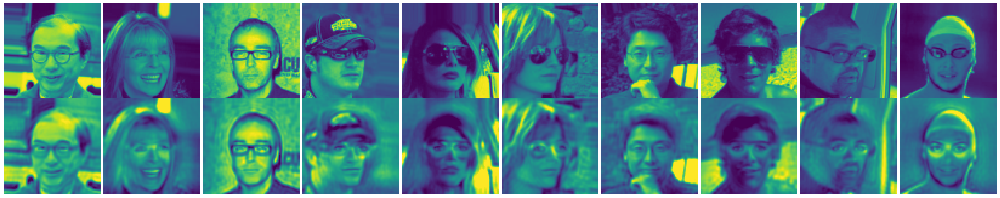

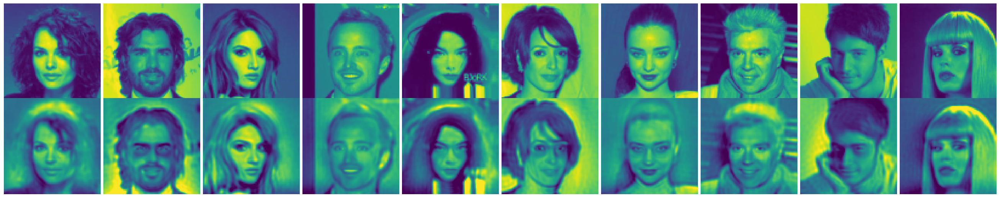

In [36]:
pca_offline = FairStreamingPCA(TARGET_ATTR, device='cpu')
pca_offline.fit_offline(
    loader=loader_train,
    target_unfair_dim=2,
    target_pca_dim=1000,
    constraint='all',
)

algo = 'fairAll2Offline'
comparison_figure(pca_offline, dataset_train, attr_true_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_true.pdf')
comparison_figure(pca_offline, dataset_train, attr_false_list_train, f'{style}_{TARGET_ATTR}_{algo}_train_false.pdf')
comparison_figure(pca_offline, dataset_val, attr_true_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_true.pdf')
comparison_figure(pca_offline, dataset_val, attr_false_list_val, f'{style}_{TARGET_ATTR}_{algo}_val_false.pdf')